# Getting started

## Overview

NVIDIA Data Loading Library (DALI) is a collection of highly optimized building blocks and an execution engine that accelerates the data pipeline for deep learning applications.

Input and augmentation pipelines provided by Deep Learning frameworks fit typically into one of two categories:

* fast, but inflexible - written in C++, they are exposed as a single monolithic Python object with very specific set and ordering of operations it provides
* slow, but flexible - set of building blocks written in either C++ or Python, that can be used to compose arbitrary data pipelines that end up being slow. One of the biggest overheads for this type of data pipelines is Global Interpreter Lock (GIL) in Python. This forces developers to use multiprocessing, complicating the design of efficient input pipelines.
 
DALI stands out by providing both performance and flexibility of accelerating different data pipelines. It achieves that by exposing optimized building blocks which are executed using simple and efficient engine, and enabling offloading of operations to GPU (thus enabling scaling to multi-GPU systems).

It is a single library, that can be easily integrated into different deep learning training and inference applications.

## Optimal configuration

DALI offers ease-of-use and flexibility across GPU enabled systems with direct framework plugins, multiple input data formats, and configurable graphs. DALI can help achieve overall speedup on deep learning workflows that are bottlenecked on I/O pipelines due to the limitations of CPU cycles. Typically, systems with high GPU to CPU ratio (such as Amazon EC2 P3.16xlarge, NVIDIA DGX1-V or upcoming NVIDIA DGX-2) are constrained on the host CPU, thereby under-utilizing the available GPU compute capabilities. DALI significantly accelerates input processing on such dense GPU configurations to achieve the overall throughput.

## Pipeline

The most important type in DALI is the Pipeline. It contains all the necessary information and multiple functions related to defining, building and running the pipeline.

In [1]:
from nvidia.dali.pipeline import Pipeline
help(Pipeline)

Help on class Pipeline in module nvidia.dali.pipeline:

class Pipeline(builtins.object)
 |  Pipeline class is the base of all DALI data pipelines. The pipeline
 |  encapsulates the data processing graph and the execution engine.
 |  
 |  Parameters
 |  ----------
 |  `batch_size` : int, optional, default = -1
 |      Maximum batch size of the pipeline. Negative values for this parameter
 |      are invalid - the default value may only be used with
 |      serialized pipeline (the value stored in serialized pipeline
 |      is used instead). In most cases, the actual batch size of the pipeline
 |      will be equal to the maximum one. Running the DALI Pipeline with a smaller batch size
 |      is also supported. The batch size might change from iteration to iteration.
 |  
 |      Please note, that DALI might perform memory preallocations according to this
 |      parameter. Setting it too high might result in out-of-memory failure.
 |  `num_threads` : int, optional, default = -1
 |    

### Defining the Pipeline

Let us start with defining a very simple pipeline for classifier determining whether a picture contains dog or a cat.

We prepared a directory structure containing picture of dogs and cats:

In [2]:
import os.path
import fnmatch

for root, dir, files in os.walk("data/images"):
        depth = root.count('/')
        ret = ""
        if depth > 0:
            ret += "  " * (depth - 1) + "|-"
        print (ret + root)
        for items in fnmatch.filter(files, "*"):
                print (" " * len(ret) + "|-" + items)

|-data/images
  |-file_list.txt
  |-data/images/dog
    |-dog_1.jpg
    |-dog_8.jpg
    |-dog_5.jpg
    |-dog_9.jpg
    |-dog_6.jpg
    |-dog_3.jpg
    |-dog_2.jpg
    |-dog_4.jpg
    |-dog_7.jpg
    |-dog_11.jpg
    |-dog_10.jpg
  |-data/images/kitten
    |-cat_10.jpg
    |-cat_6.jpg
    |-cat_3.jpg
    |-cat_8.jpg
    |-cat_1.jpg
    |-cat_4.jpg
    |-cat_2.jpg
    |-cat_5.jpg
    |-cat_7.jpg
    |-cat_9.jpg


Our simple pipeline will read images from this directory, decode them and return (image, label) pairs.

In [3]:
from nvidia.dali import pipeline_def
import nvidia.dali.fn as fn
import nvidia.dali.types as types

image_dir = "data/images"
batch_size = 8

@pipeline_def
def simple_pipeline():
    jpegs, labels = fn.file_reader(file_root=image_dir)
    images = fn.image_decoder(jpegs, device='cpu', output_type=types.RGB)

    return images, labels

The `SimplePipeline` class is a subclass of `dali.pipeline.Pipeline`, which provides most of the methods to create and launch a pipeline. The only 2 methods that we need to implement is the constructor and `define_graph` function.

In the constructor we first call our superclass constructor, in order to set global parameters of the pipeline:

* batch size,
* number of threads used to perform computation on the CPU,
* which GPU device to use (`SimplePipeline` does not yet use GPU for compute though)
* seed for random number generation
 
In the constructor we also define member variables of our `SimplePipeline` class as operations defined in `dali.ops` module:

* `FileReader` - traverses the directory and returns pairs of (encoded image, label)
* `ImageDecoder` - takes an encoded image input and outputs decoded RGB image

In the `define_graph` function we define the actual flow of computation:
```
jpegs, labels = self.input()
```
uses our `input` operation to create `jpegs` (encoded images) and `labels`.
```
images = self.decode(jpegs)
```
Next, we use the `decode` operation to create `images` (decoded RGB images).
```
return (images, labels)
```
Finally, we specify which of the intermediate variables should be returned as outputs of the pipeline.

### Building the Pipeline

In order to use pipeline created with `simple_pipeline`, we need to build it. This is achieved by calling `build` function.

In [4]:
pipe = simple_pipeline(batch_size=batch_size, num_threads=1, device_id=0)
pipe.build()

### Running the Pipeline

After the pipeline is built, we can run it to get the batch of results.

In [5]:
pipe_out = pipe.run()
print(pipe_out)

(<nvidia.dali.backend_impl.TensorListCPU object at 0x7fe54017e5a8>, <nvidia.dali.backend_impl.TensorListCPU object at 0x7fe54017e848>)


The output of the pipeline, which we saved to `pipe_out` variable, is a list of 2 elements (as expected - we specified 2 outputs in `simple_pipeline` function). Both of these elements are `TensorListCPU` objects - each contains a list of tensors on the CPU.

In order to show the results (just for debugging purposes - during the actual training we would not do that step, as it would make our batch of images do a round trip from GPU to CPU and back) we can send our data from DALI's Tensor to NumPy array. Not every `TensorList` can be accessed that way though - `TensorList` is more general than NumPy array and can hold tensors with different shapes. In order to check whether we can send it to NumPy directly, we can call the `is_dense_tensor` function of `TensorList`

In [6]:
images, labels = pipe_out
print("Images is_dense_tensor: " + str(images.is_dense_tensor()))
print("Labels is_dense_tensor: " + str(labels.is_dense_tensor()))

Images is_dense_tensor: False
Labels is_dense_tensor: True


As it turns out, `TensorList` containing labels can be represented by a tensor, while the `TensorList` containing images cannot.

Let us see, what is the shape and contents of returned labels.

In [7]:
import numpy as np

labels_tensor = labels.as_tensor()

print (labels_tensor.shape())
print (np.array(labels_tensor))

[8, 1]
[[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]]


In order to see the images, we will need to loop over all tensors contained in `TensorList`, accessed with its `at` method.

In [8]:
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
%matplotlib inline

def show_images(image_batch):
    columns = 4
    rows = (batch_size + 1) // (columns)
    fig = plt.figure(figsize = (32,(32 // columns) * rows))
    gs = gridspec.GridSpec(rows, columns)
    for j in range(rows*columns):
        plt.subplot(gs[j])
        plt.axis("off")
        plt.imshow(image_batch.at(j))

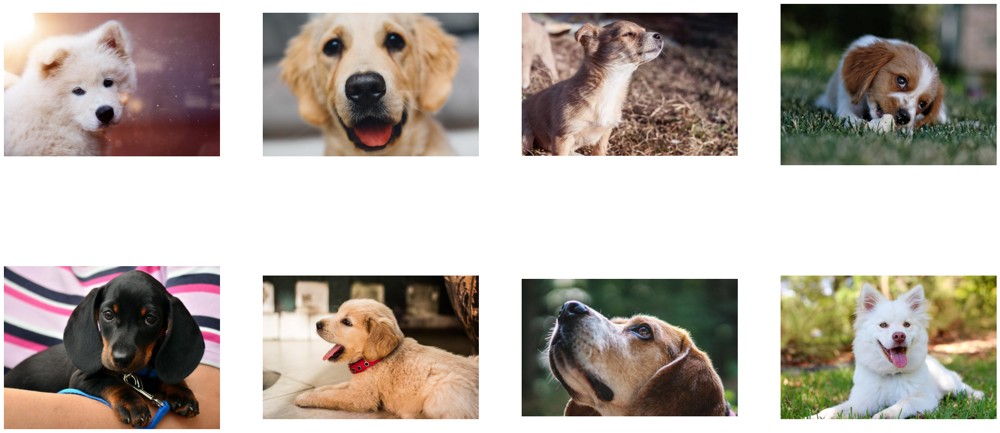

In [9]:
show_images(images)

## Adding Augmentations

### Random Shuffle

As we can see from the example above, the first batch of images returned by our pipeline contains only dogs. That is because we did not shuffle our dataset, and so `file_reader` returns images in order in which it encountered them while traversing the directory structure.

Let us make a new pipeline, that will change that.

In [10]:
@pipeline_def
def shuffled_pipeline():
    jpegs, labels = fn.file_reader(file_root=image_dir, random_shuffle=True, initial_fill=21)
    images = fn.image_decoder(jpegs, device='cpu', output_type=types.RGB)

    return images, labels

We made 2 changes to the `simple_pipeline` to obtain `shuffled_pipeline` - we added 2 arguments to the `file_reader` operation

* `random_shuffle` enables shuffling of images in the reader. Shuffling is performed using a buffer of images read from disk. When reader is asked to provide a next image, it randomly selects an image from the buffer, outputs it and immediately replaces that spot in a buffer with a freshly read image.
* `initial_fill` sets the capacity of the buffer. The default value of this parameter (1000), well suited for datasets containing thousands of examples, is too big for our very small dataset, which contains only 21 images. This could result in frequent duplicates in the returned batch. That is why in this example we set it to the size of our dataset.
 
Let us test the result of this modification.

In [11]:
pipe = shuffled_pipeline(batch_size=batch_size, num_threads=1, device_id=0, seed=12)
pipe.build()

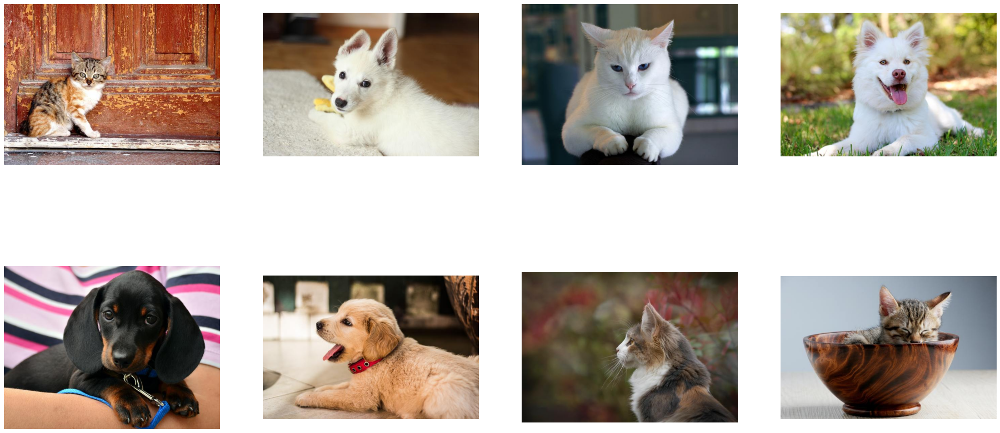

In [12]:
pipe_out = pipe.run()
images, labels = pipe_out
show_images(images)

Now the images returned by the pipeline are shuffled properly.

### Augmentations

DALI can not only read images from disk and batch them into tensors, it can also perform various augmentations on those images to improve Deep Learning training results.

One example of such augmentations is rotation. Let us make a new pipeline, which rotates the images before outputting them.

In [13]:
@pipeline_def
def rotated_pipeline():
    jpegs, labels = fn.file_reader(file_root=image_dir, random_shuffle=True, initial_fill=21)
    images = fn.image_decoder(jpegs, device='cpu', output_type=types.RGB)
    rotated_images = fn.rotate(images, angle=10.0, fill_value=0)

    return rotated_images, labels

To do that, we added a new operation to our pipeline: `fn.rotate`. To obtain information on required and optional arguments of any operation provided by DALI, we can use `help` function.

In [14]:
help(fn.rotate)

Help on function rotate in module nvidia.dali.fn:

rotate(*inputs, **kwargs)
    Rotates the images by the specified angle.
    
    This operator supports volumetric data.
    
    Supported backends
     * 'cpu'
     * 'gpu'
    
    
    Args
    ----
    `input` : TensorList ('HWC', 'DHWC')
        Input to the operator.
    
    
    Keyword args
    ------------
    `angle` : float or TensorList of float
        Angle, in degrees, by which the image is rotated.
        
        For two-dimensional data, the rotation is counter-clockwise, assuming the top-left corner is
        at ``(0,0)``. For three-dimensional data, the ``angle`` is a positive rotation around the provided
        axis.
    `axis` : float or list of float or TensorList of float, optional, default = []
        Applies **only** to three-dimension and is the axis
        around which to rotate the image.
        
        The vector does not need to be normalized, but it must have a non-zero length.
        Reversin

As we can see, `rotate` can take multiple arguments, but only one of them, `angle`, is required - it tells the operator how much it should rotate images. We also specified `fill_value` to better visualise the results.

Let us test the newly created pipeline:

In [15]:
pipe = rotated_pipeline(batch_size=batch_size, num_threads=1, device_id=0, seed=12)
pipe.build()

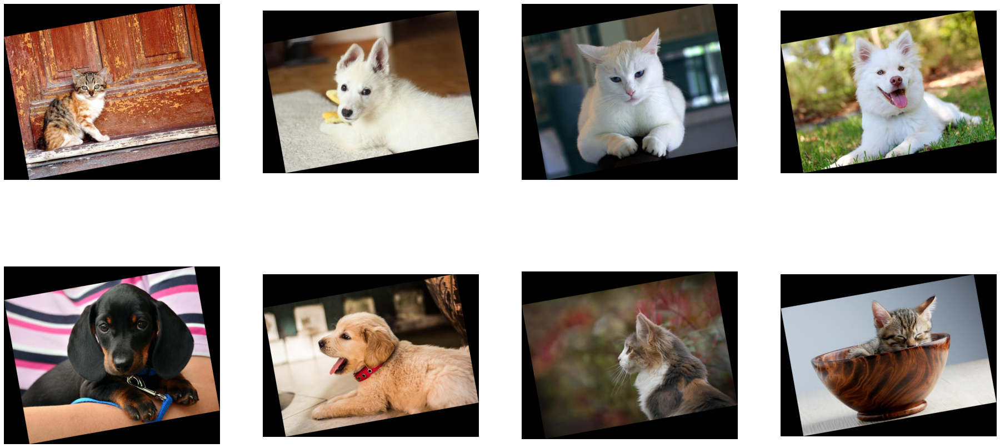

In [16]:
pipe_out = pipe.run()
images, labels = pipe_out
show_images(images)

### Tensors as Arguments and Random Number Generation

Rotating every image by 10 degrees is not that interesting. To make a meaningful augmentation, we would like an operator that rotates our images by a random angle in a given range. 

The `help` output for `rotate` operation tells us, that `angle` parameter can accept `float` or `float tensor` types of values. The second option, `float tensor`, enables us to feed the operator with different rotation angles for every image, via a tensor produced by other operation.

Random number generators are examples of support operations that one can use with DALI. Let us use `fn.random.uniform` to make a pipeline with random rotation.

In [17]:
@pipeline_def
def random_rotated_pipeline():
    jpegs, labels = fn.file_reader(file_root=image_dir, random_shuffle=True, initial_fill=21)
    images = fn.image_decoder(jpegs, device='cpu', output_type=types.RGB)
    angle = fn.random.uniform(range=(-10.0, 10.0))
    rotated_images = fn.rotate(images, angle=angle, fill_value=0)

    return rotated_images, labels

This time, instead of providing a fixed value for the `angle` argument in the constructor, we set it to the output of the `fn.random.uniform` operator.

Let us check the result:

In [18]:
pipe = random_rotated_pipeline(batch_size=batch_size, num_threads=1, device_id=0, seed=12)
pipe.build()

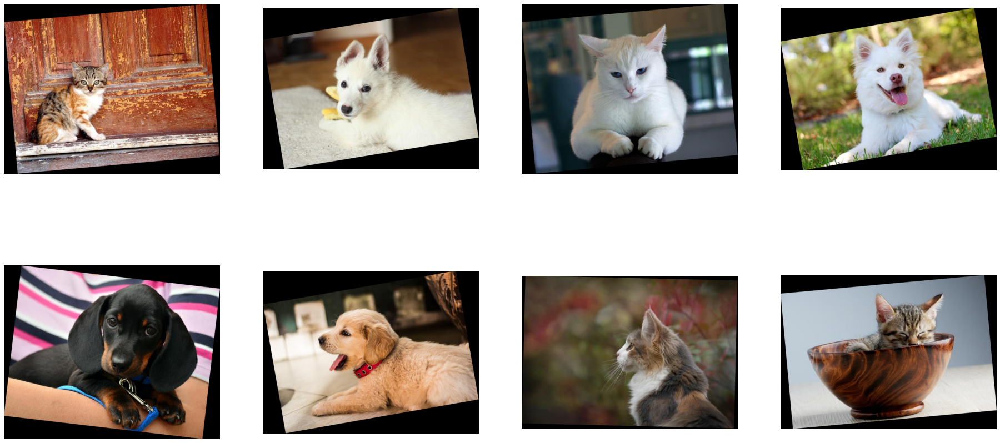

In [19]:
pipe_out = pipe.run()
images, labels = pipe_out
show_images(images)

This time, the rotation angle is randomly selected from a value range.

## Adding GPU Acceleration

DALI offers access to GPU accelerated operators, that can increase the speed of the input and augmentation pipeline and let it scale to multi-GPU systems.

### Copying Tensors to GPU

Let us modify the previous example of the `random_rotated_pipeline` to use GPU for rotation operator.

In [20]:
@pipeline_def
def random_rotated_gpu_pipeline():
    jpegs, labels = fn.file_reader(file_root=image_dir, random_shuffle=True, initial_fill=21)
    images = fn.image_decoder(jpegs, device='cpu', output_type=types.RGB)
    angle = fn.random.uniform(range=(-10.0, 10.0))
    rotated_images = fn.rotate(images.gpu(), angle=angle, fill_value=0)

    return rotated_images, labels

In order to tell DALI that we want to use GPU, we needed to make only one change to the pipeline. We changed input to the `rotate` from `images`, which is a tensor on the CPU, to `images.gpu()` which copies it to the GPU.

In [21]:
pipe = random_rotated_gpu_pipeline(batch_size=batch_size, num_threads=1, device_id=0, seed=12)
pipe.build()

In [22]:
pipe_out = pipe.run()
print(pipe_out)

(<nvidia.dali.backend_impl.TensorListGPU object at 0x7fe4a09b8030>, <nvidia.dali.backend_impl.TensorListCPU object at 0x7fe4a09b80d8>)


`pipe_out` still contains 2 `TensorLists`, but this time the first output, result of the `rotate` operation, is on the GPU. We cannot access contents of `TensorListGPU` directly from the CPU, so in order to visualize the result we need to copy it to the CPU by using `as_cpu` method.

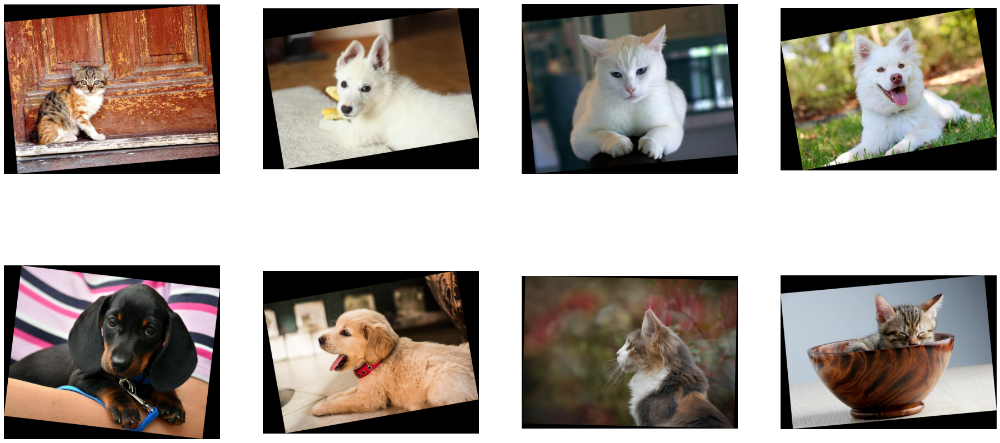

In [23]:
images, labels = pipe_out
show_images(images.as_cpu())

#### Important Notice
DALI does not support moving the data from the GPU to the CPU within the pipeline. In all execution paths an operation on the CPU cannot follow an operation on the GPU.

### Hybrid Decoding

Sometimes, especially for higher resolution images, decoding images stored in JPEG format may become a bottleneck. To address this problem, nvJPEG library was developed. It splits the decoding process between CPU and GPU, significantly reducing the decoding time.

Specifying "mixed" device parameter in `image_decoder` enables nvJPEG support. Other file formats are still decoded on the CPU.

In [24]:
@pipeline_def
def hybrid_pipeline():
    jpegs, labels = fn.file_reader(file_root=image_dir, random_shuffle=True, initial_fill=21)
    images = fn.image_decoder(jpegs, device='mixed', output_type=types.RGB)

    return images, labels

`image_decoder` with `device=mixed` uses a hybrid approach of computation that employs both the CPU and the GPU. This means that it accepts CPU inputs, but returns GPU outputs. That is why `images` objects returned from the pipeline are of type `TensorListGPU`.

In [25]:
pipe = hybrid_pipeline(batch_size=batch_size, num_threads=1, device_id=0, seed=12)
pipe.build()

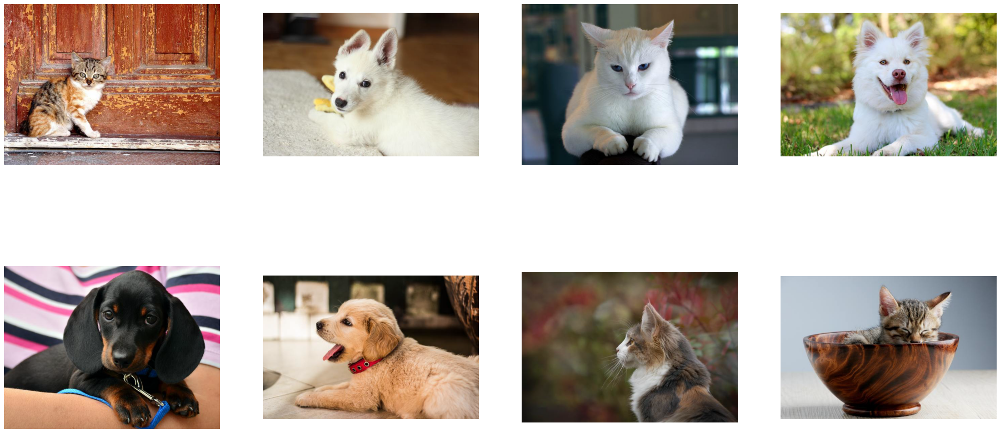

In [26]:
pipe_out = pipe.run()
images, labels = pipe_out
show_images(images.as_cpu())

Let us compare the speed of `image_decoder` for 'cpu' and 'mixed' backends by measuring speed of `shuffled_pipeline` and `hybrid_pipeline` with 4 CPU threads.

In [27]:
from timeit import default_timer as timer

test_batch_size = 64

def speedtest(pipeline, batch, n_threads):
    pipe = pipeline(batch_size=batch, num_threads=n_threads, device_id=0)
    pipe.build()
    # warmup
    for i in range(5):
        pipe.run()
    # test
    n_test = 20
    t_start = timer()
    for i in range(n_test):
        pipe.run()
    t = timer() - t_start
    print("Speed: {} imgs/s".format((n_test * batch)/t))

In [28]:
speedtest(shuffled_pipeline, test_batch_size, 4)

Speed: 2228.811381907266 imgs/s


In [29]:
speedtest(hybrid_pipeline, test_batch_size, 4)

Speed: 5443.819367352705 imgs/s
